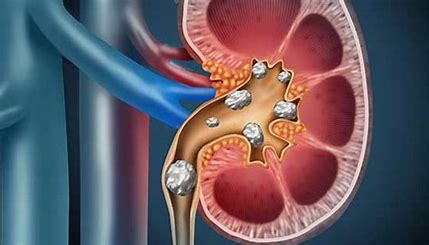

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('kidney_stone_data.csv')

In [5]:
df.head()

,id,gravity,ph,osmo,cond,urea,calc,target
0,0,1.013,6.19,443,14.8,124,1.45,0
1,1,1.025,5.40,703,23.6,394,4.18,0
2,2,1.009,6.13,371,24.5,159,9.04,0
3,3,1.021,4.91,442,20.8,398,6.63,1
4,4,1.021,5.53,874,17.8,385,2.21,1


In [7]:
df.tail()

,id,gravity,ph,osmo,cond,urea,calc,target
409,409,1.011,5.21,527,21.4,75,1.53,0
410,410,1.024,5.53,577,19.7,224,0.77,0
411,411,1.018,6.28,455,22.2,270,7.68,1
412,412,1.008,7.12,325,12.6,75,1.03,1
413,413,1.011,6.13,364,9.9,159,0.27,0


In [9]:
df.shape

(414, 8)

In [11]:
df.columns

Index(['id', 'gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target'], dtype='object')

In [13]:
df.duplicated().sum()

0

In [15]:
df.isnull().sum()

id         0
gravity    0
ph         0
osmo       0
cond       0
urea       0
calc       0
target     0
dtype: int64

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       414 non-null    int64  
 1   gravity  414 non-null    float64
 2   ph       414 non-null    float64
 3   osmo     414 non-null    int64  
 4   cond     414 non-null    float64
 5   urea     414 non-null    int64  
 6   calc     414 non-null    float64
 7   target   414 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 26.0 KB


In [19]:
df.describe()

,id,gravity,ph,osmo,cond,urea,calc,target
count,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000
mean,206.500000,1.017894,5.955459,651.545894,21.437923,278.657005,4.114638,0.444444
std,119.655756,0.006675,0.642260,234.676567,7.514750,136.442249,3.217641,0.497505
min,0.000000,1.005000,4.760000,187.000000,5.100000,10.000000,0.170000,0.000000
25%,103.250000,1.012000,5.530000,455.250000,15.500000,170.000000,1.450000,0.000000
50%,206.500000,1.018000,5.740000,679.500000,22.200000,277.000000,3.130000,0.000000
75%,309.750000,1.022000,6.280000,840.000000,27.600000,385.000000,6.630000,1.000000
max,413.000000,1.040000,7.940000,1236.000000,38.000000,620.000000,14.340000,1.000000


In [21]:
df.nunique()

id         414
gravity     28
ph          71
osmo        80
cond        65
urea        73
calc        85
target       2
dtype: int64

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

In [24]:
import numpy as np

In [25]:
import warnings
warnings.filterwarnings('ignore')

In [26]:
df = df.drop('id', axis = 1)

In [27]:
df['target'].unique()

array([0, 1], dtype=int64)

In [28]:
df['target'].value_counts()

target
0    230
1    184
Name: count, dtype: int64

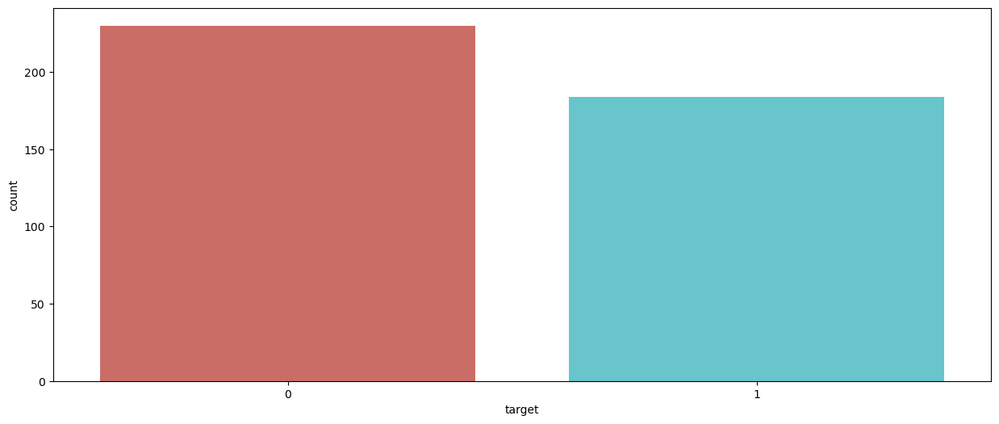

In [29]:
plt.figure(figsize=(15, 6))
sns.countplot(x='target', data=df, palette='hls')
plt.show()

plt.figure(figsize=(15,6))
sns.countplot(x = 'target', data = df, palette = 'hls')
plt.show()

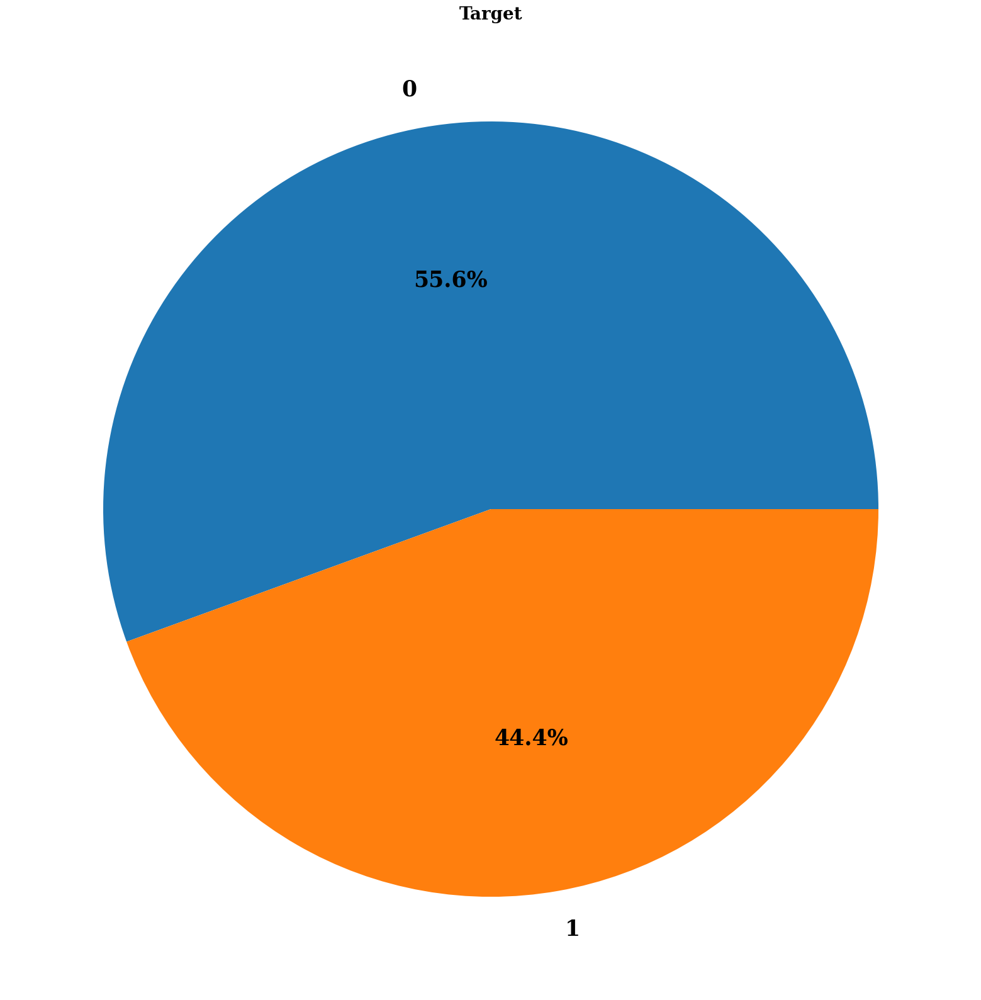

In [31]:
plt.figure(figsize=(30,20)) 
plt.pie(df['target'].value_counts(), labels=df['target'].value_counts().index, autopct='%1.1f%%', textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' }) 
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Target', size=20, **hfont) 
plt.show()

In [32]:
import plotly.express as px

fig = px.bar(df, x="target", y= df.index)
fig.show()

In [39]:
value_counts = df['target'].value_counts()
fig = px.pie(names=value_counts.index, values=value_counts.values)
fig.update_layout(
    title='Pie Chart of Target',
    title_x=0.5
)
fig.show()

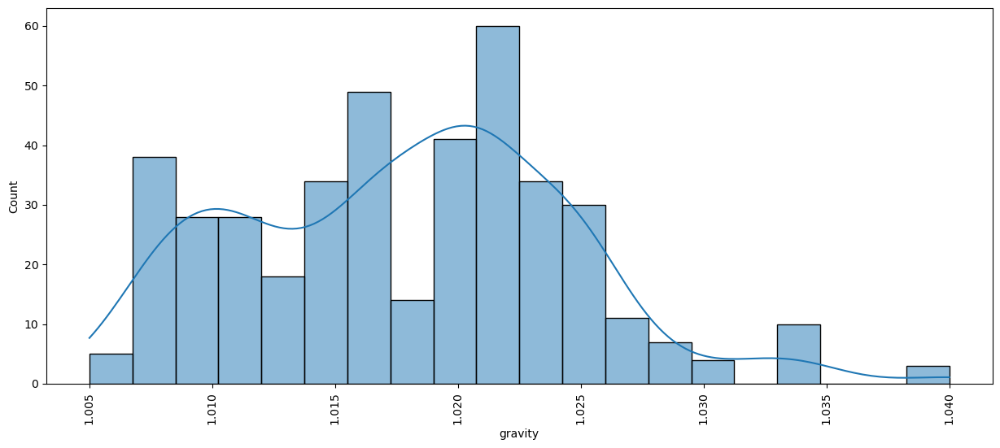

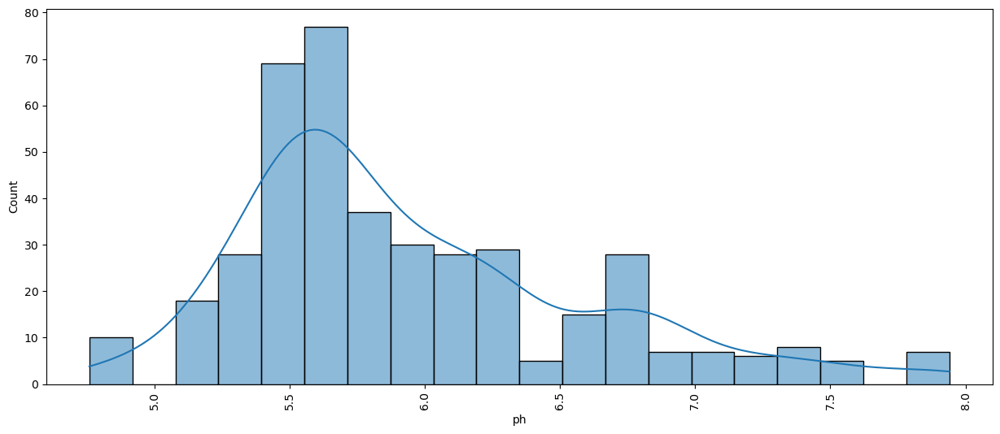

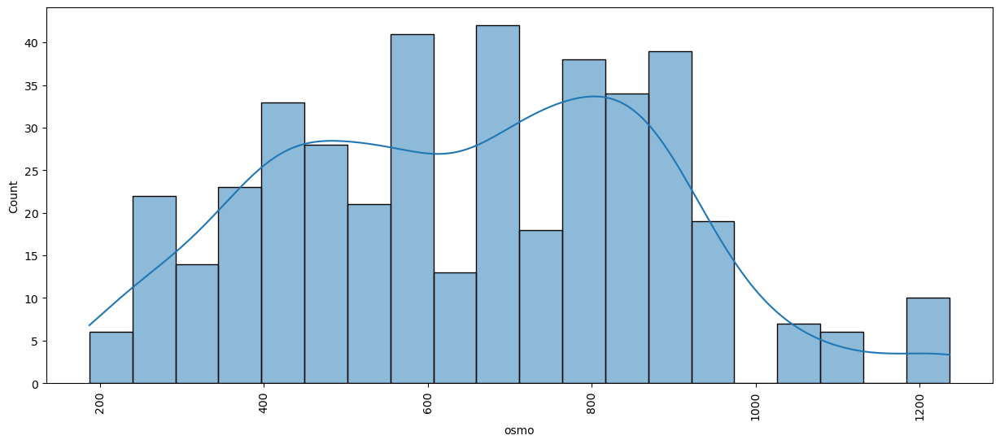

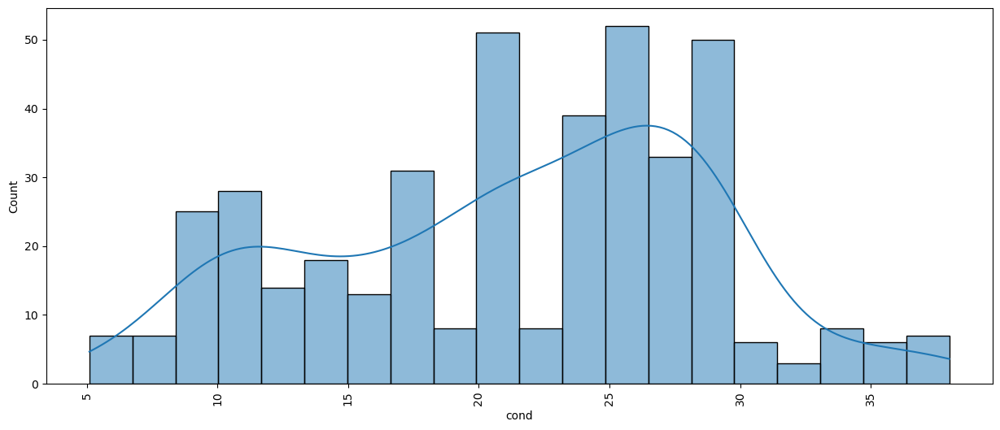

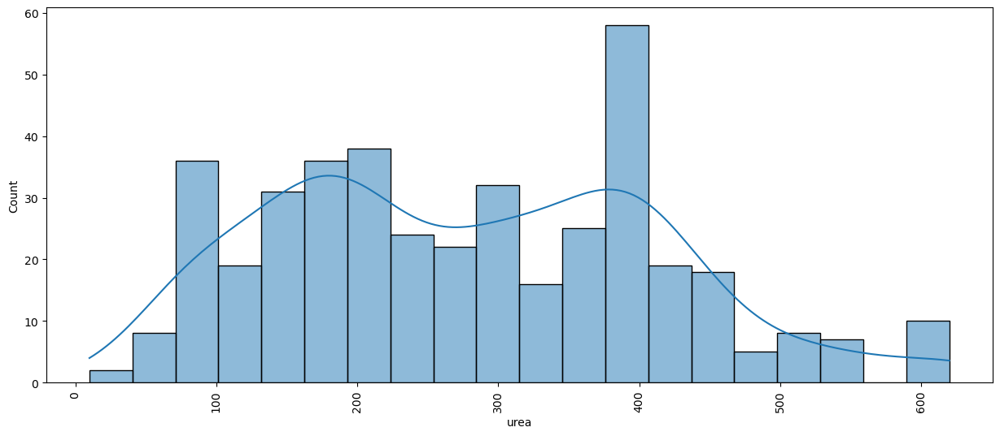

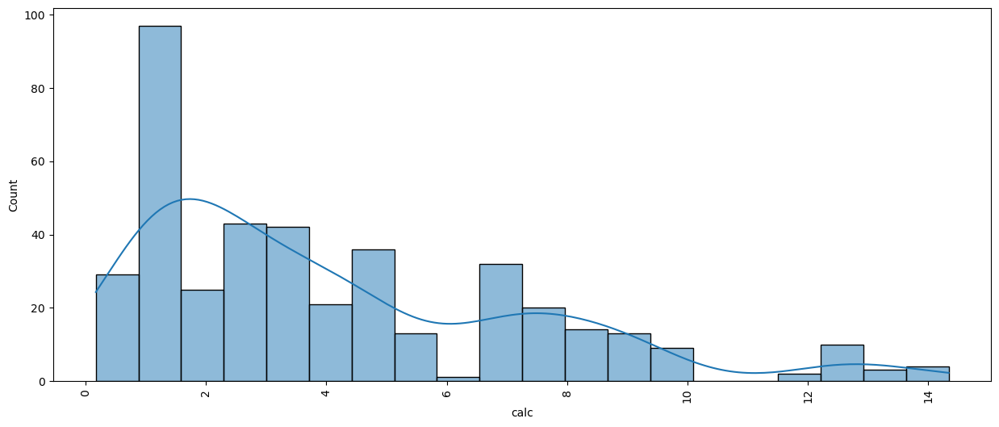

In [41]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
        plt.xticks(rotation = 90)
        plt.show()

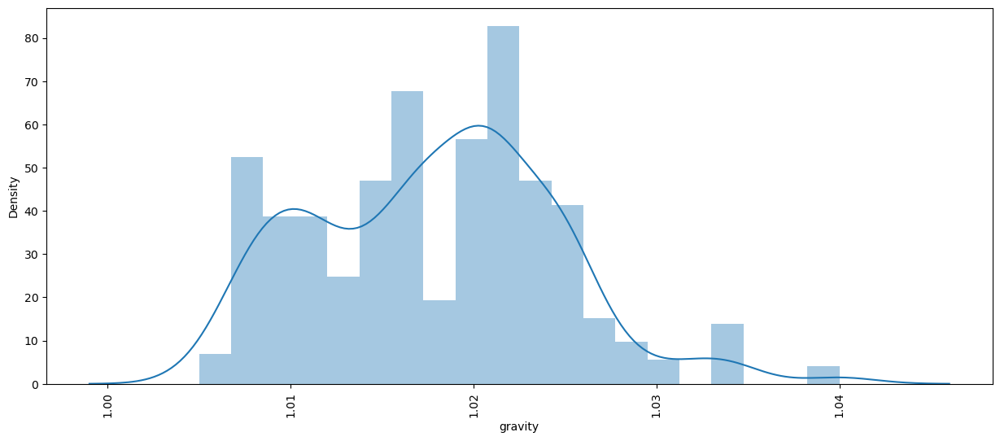

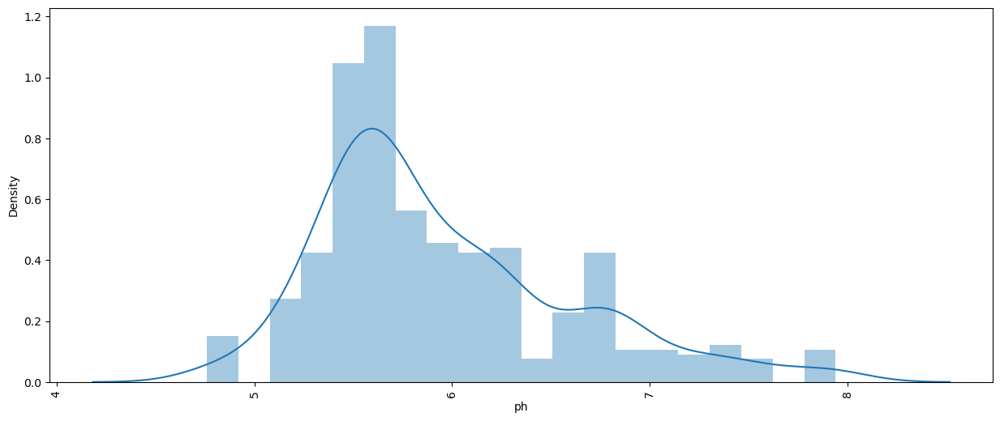

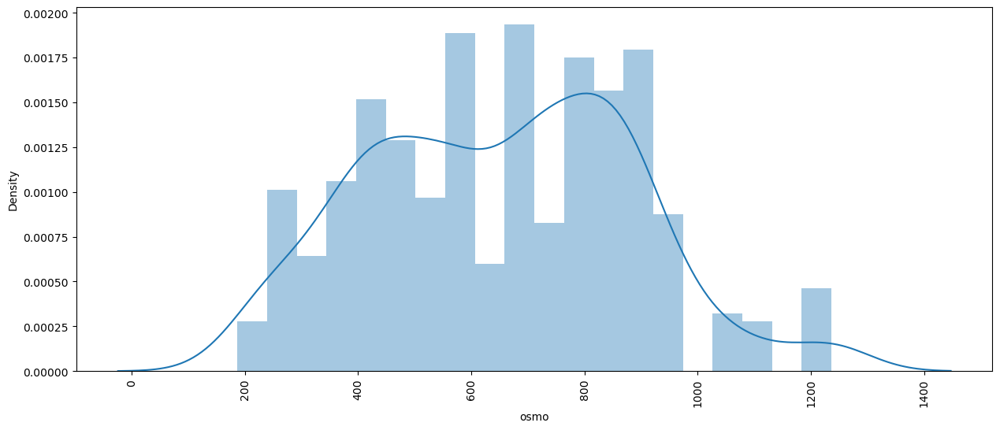

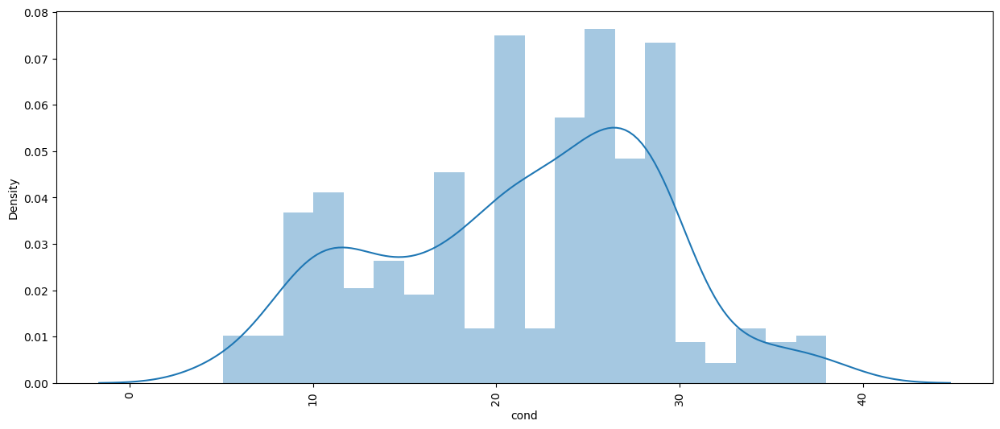

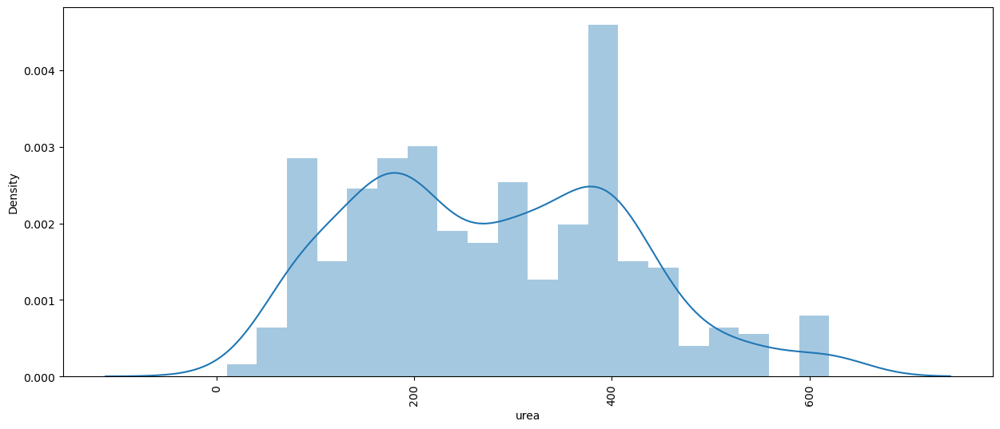

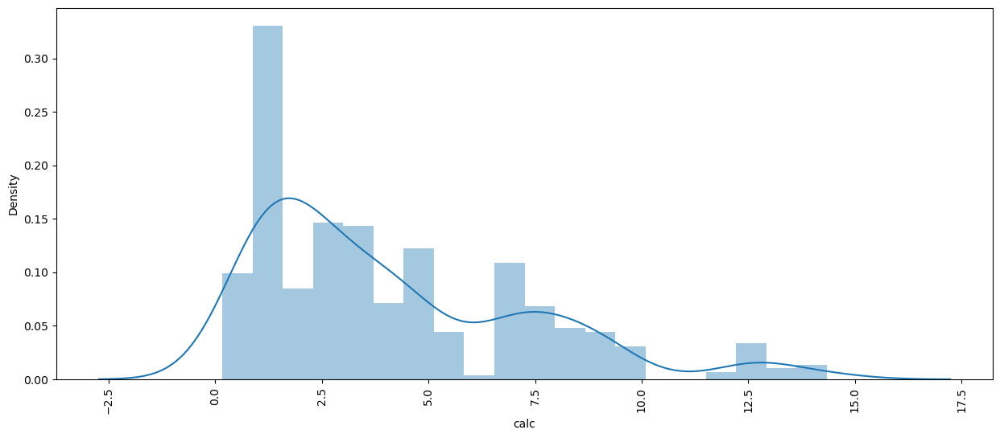

In [43]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.distplot(df[i], kde = True, bins = 20)
        plt.xticks(rotation = 90)
        plt.show()

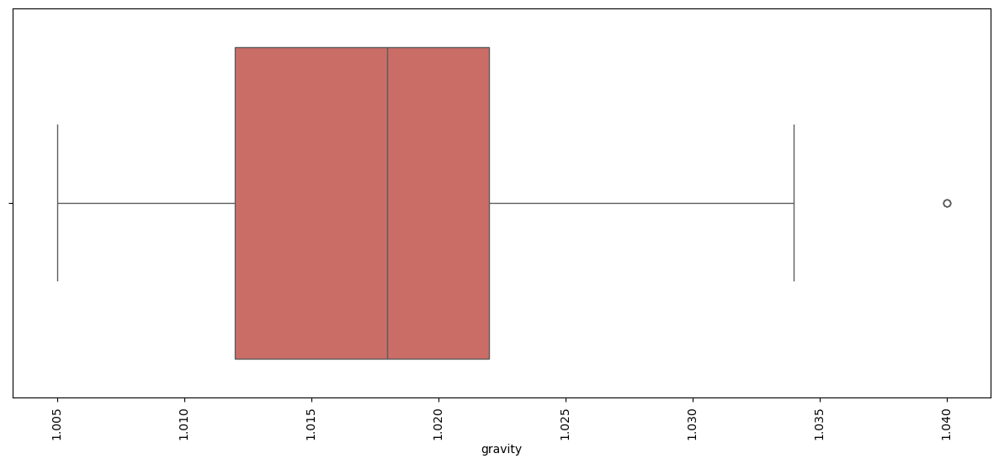

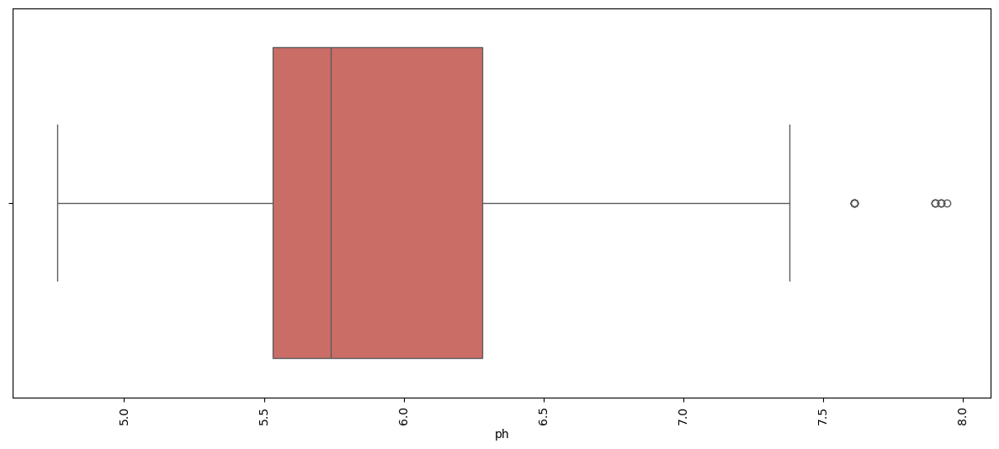

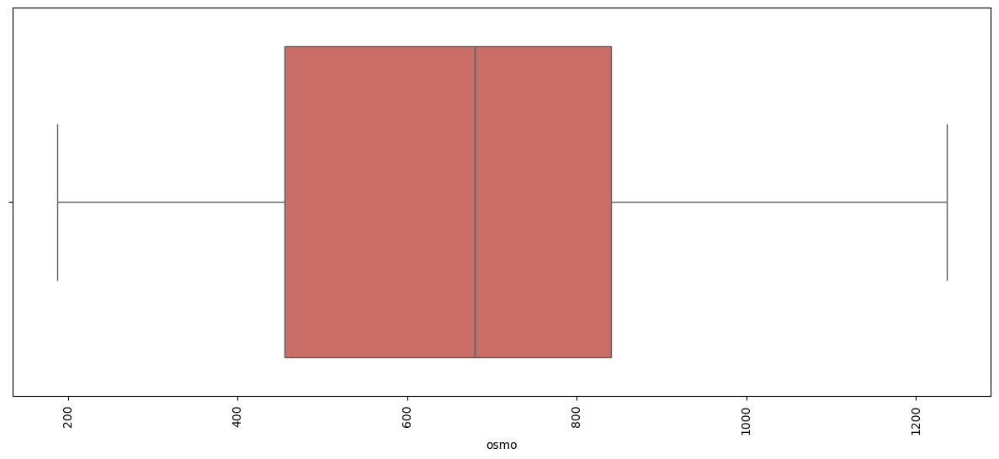

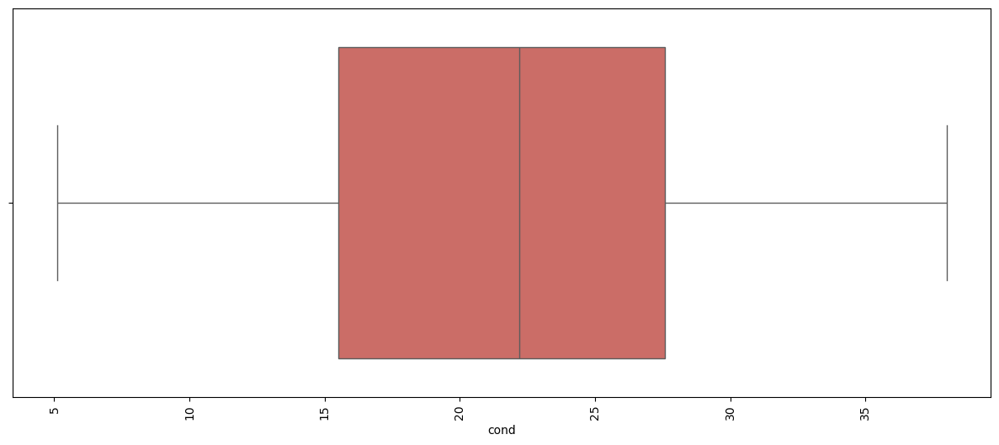

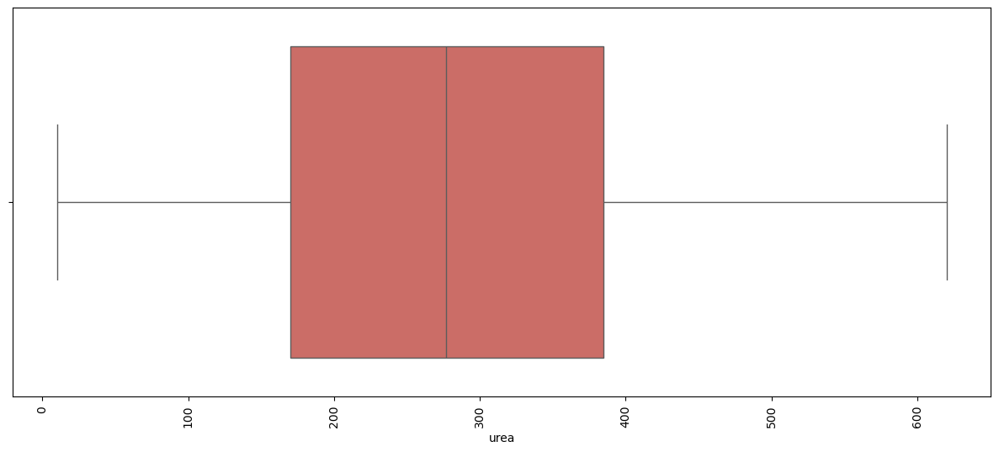

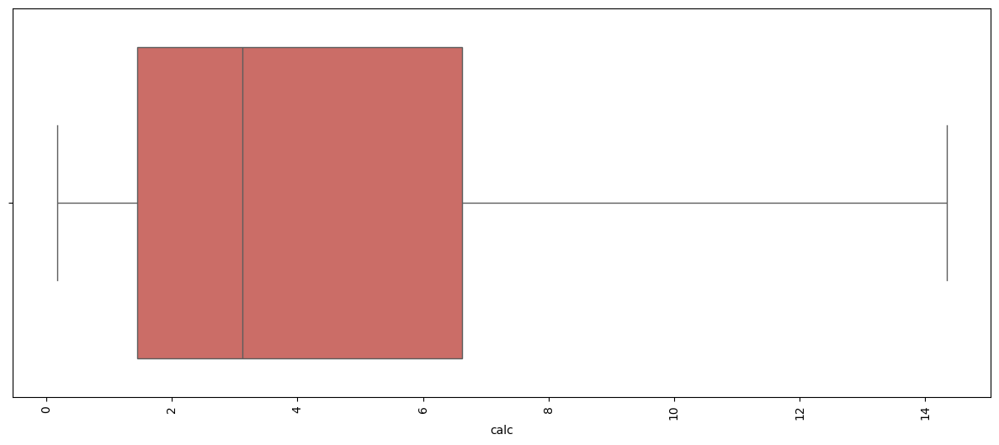

In [44]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.boxplot(x=i, data = df, palette = 'hls')
        plt.xticks(rotation = 90)
        plt.show()

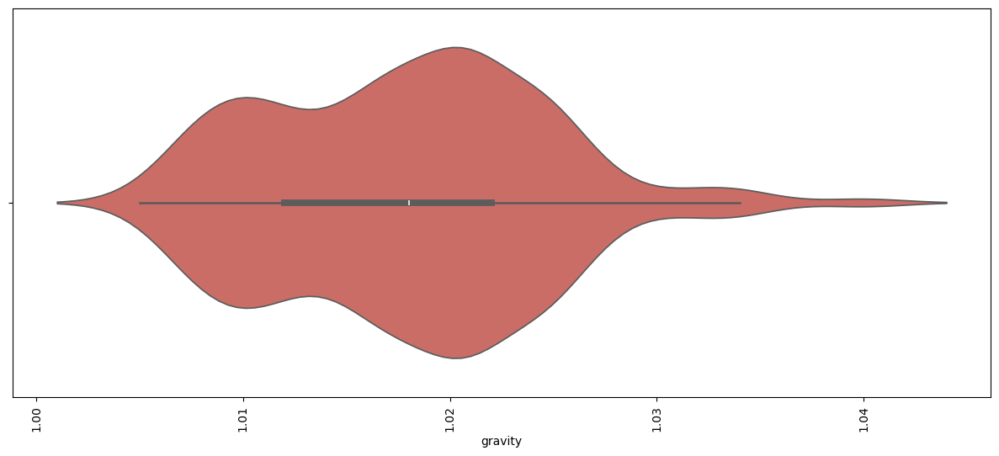

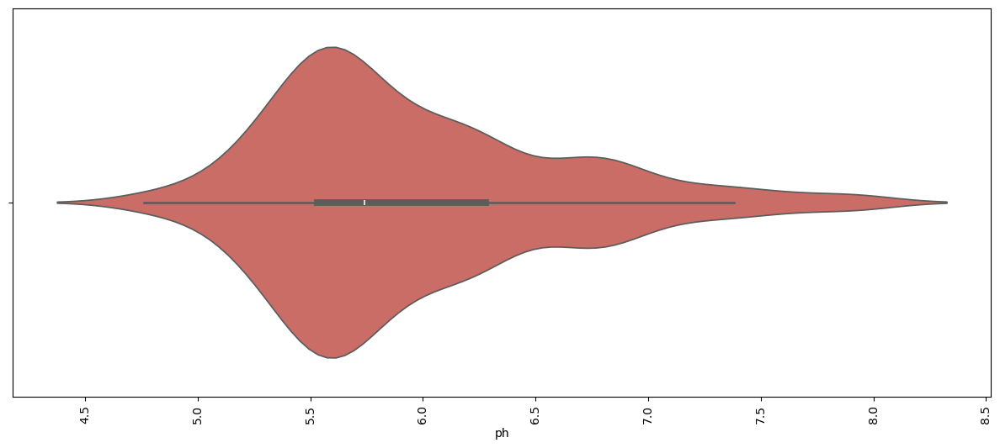

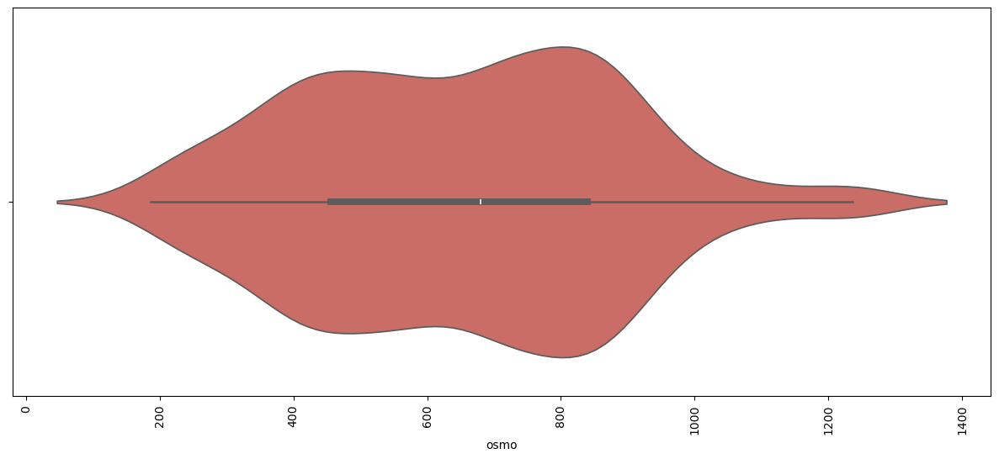

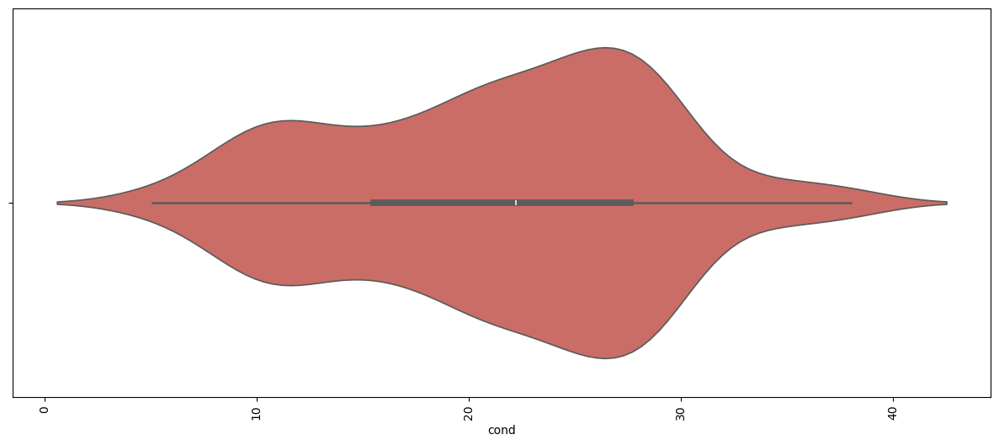

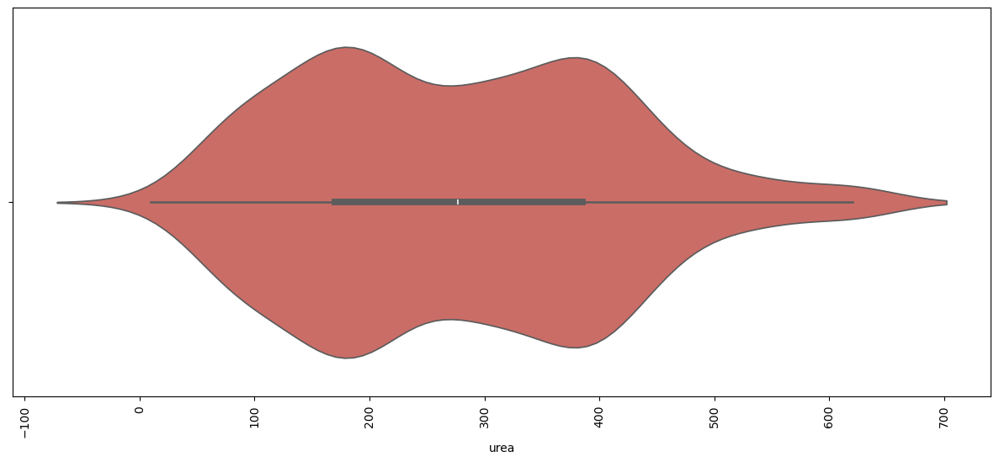

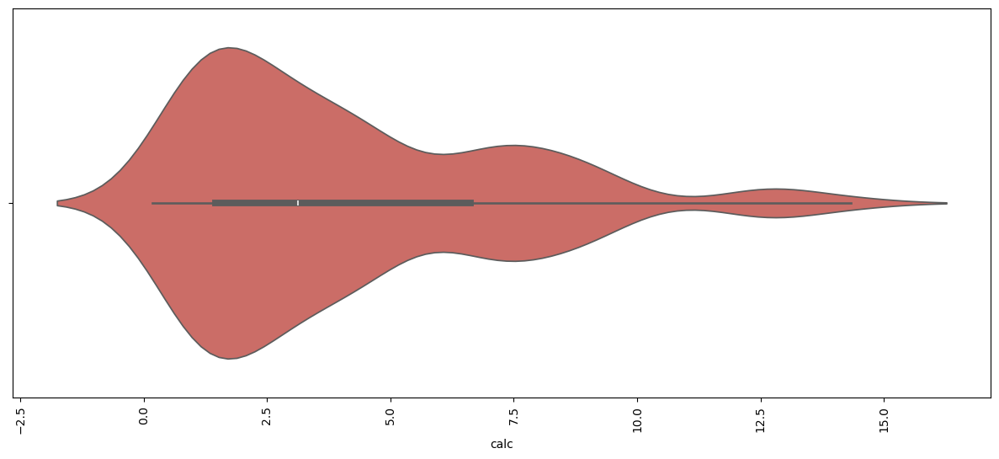

In [45]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.violinplot(x=i, data = df, palette = 'hls')
        plt.xticks(rotation = 90)
        plt.show()

In [46]:
for i in df.columns:
    if i != 'target':
        fig = px.histogram(df[i], nbins=20, color_discrete_sequence=['#636EFA'], 
                            marginal='box', opacity=0.7)
        fig.update_layout(
            title=f'Histogram of {i}',
            xaxis_title=i,
            yaxis_title='Count',
            showlegend=False
        )
        fig.show()

In [47]:
for i in df.columns:
    if i != 'target':
        fig = px.histogram(df, x=i, color_discrete_sequence=['#636EFA'], nbins=20, opacity=0.7,
                           title=f'Histogram of {i}', labels={'x': i, 'count': 'Frequency'}, 
                           template='plotly_white', width=800, height=400, 
                           marginal='rug', barmode='overlay', 
                           hover_data=[df['target']])
        fig.update_layout(xaxis=dict(type='category', title=i, 
                                     tickangle=-90, tickfont=dict(size=10)),
                          yaxis_title='Frequency', showlegend=False)
        fig.show()

In [48]:
for i in df.columns:
    if i != 'target':
        fig = px.box(df, x=df[i], color_discrete_sequence=['#636EFA'])
        fig.update_layout(
            title='Box Plot of ' + i,
            xaxis_title=i,
            yaxis_title='Value',
        )
        fig.show()

In [49]:
for i in df.columns:
    if i != 'target':
        fig = px.violin(df, y=i, x='target', box=True, points="all", hover_data=df.columns)
        fig.update_layout(title=i, xaxis_title="Target", yaxis_title=i)
        fig.show()

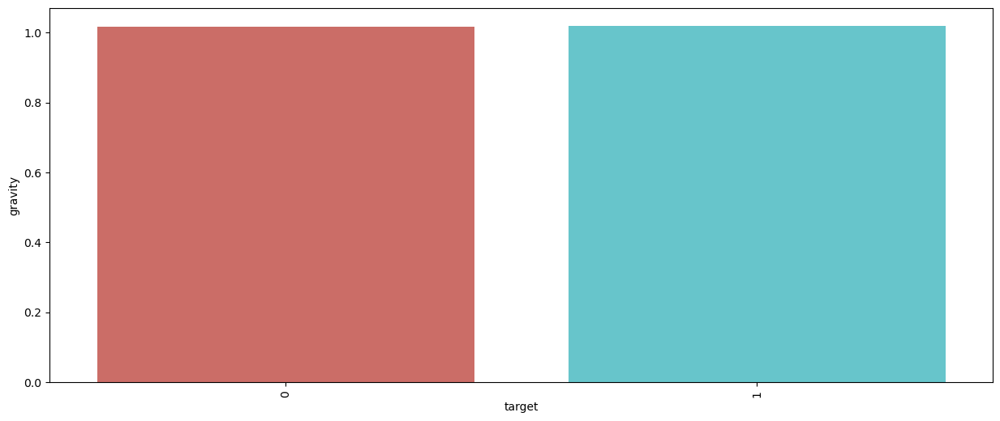

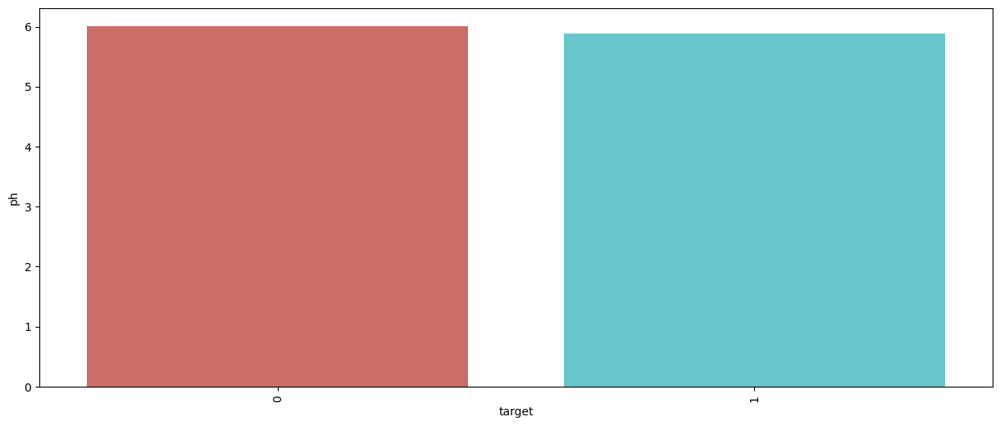

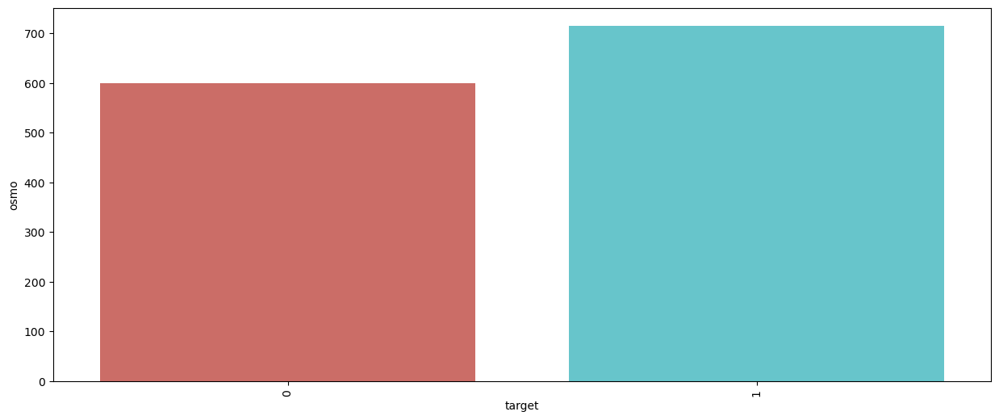

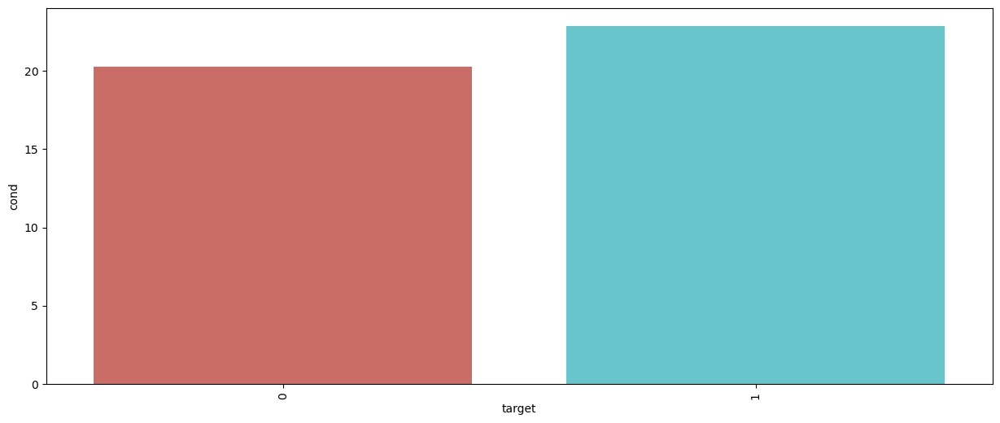

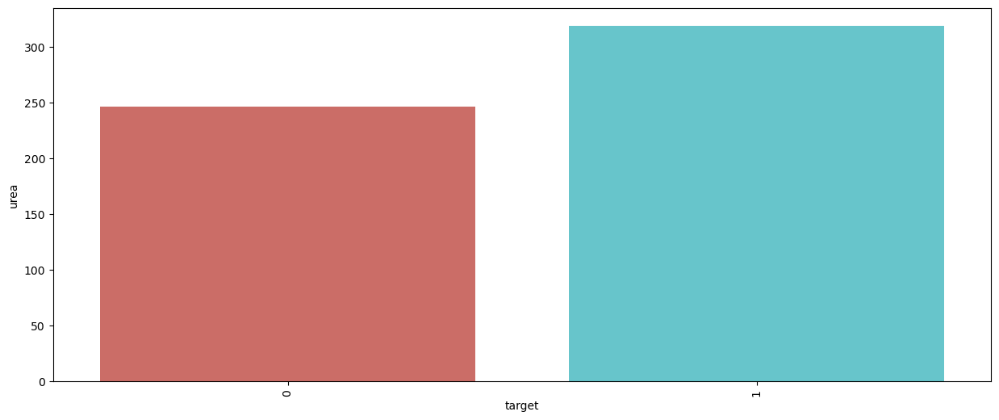

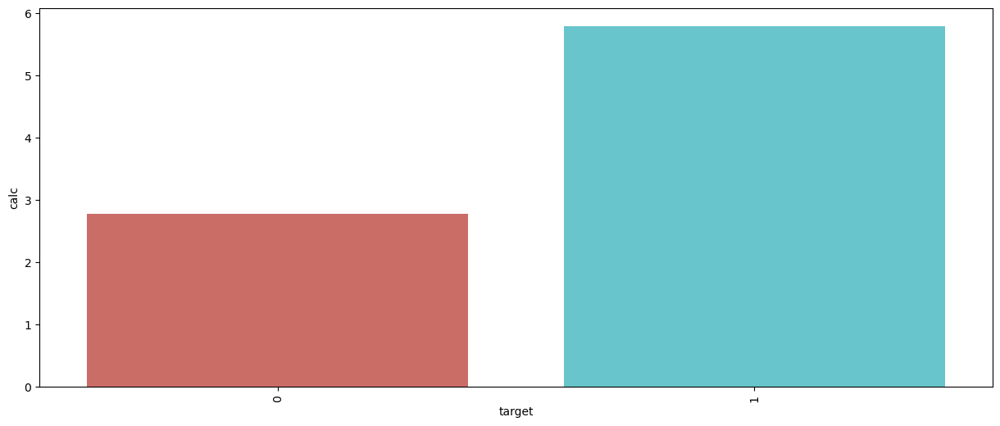

In [50]:
for i in df.columns:
    if i != 'target':
        plt.figure(figsize=(15,6))
        sns.barplot(x = df['target'], y = df[i], data = df, ci = None, palette = 'hls')
        plt.xticks(rotation = 90)
        plt.show()

In [51]:
for i in df.columns:
    if i != 'target':
        fig = px.bar(df, x="target", y=i, color="target", barmode="group")
        fig.update_layout(
            title=f"{i} by Target",
            xaxis_title="Target",
            yaxis_title=i,
            legend_title="Target"
        )
        fig.show()

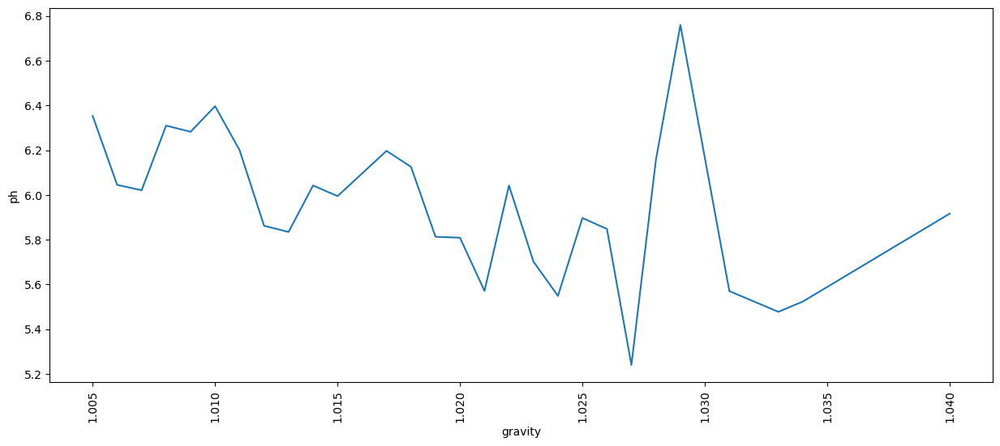

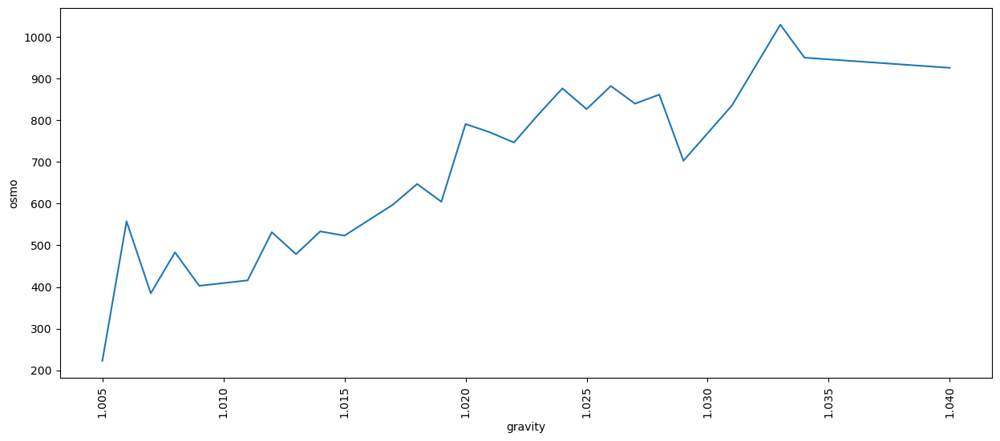

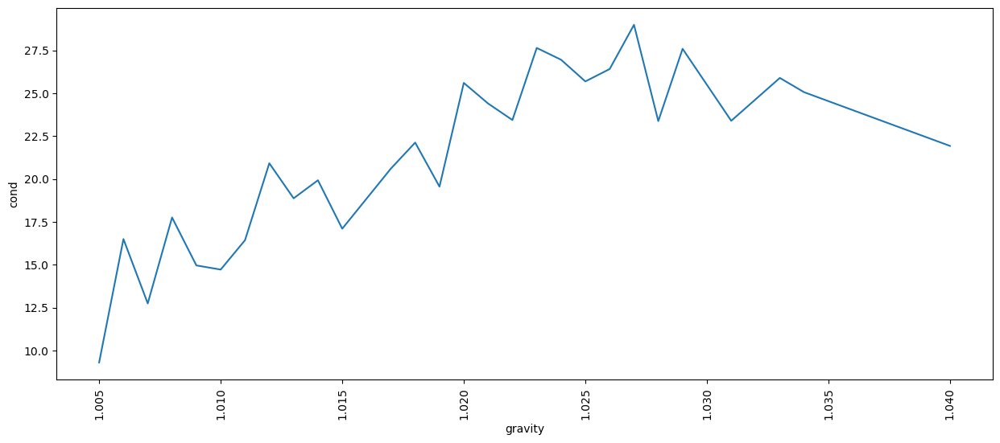

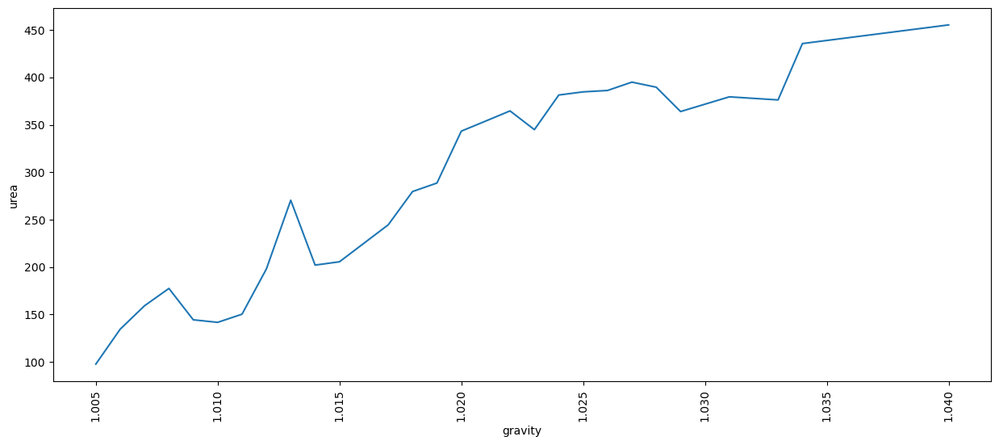

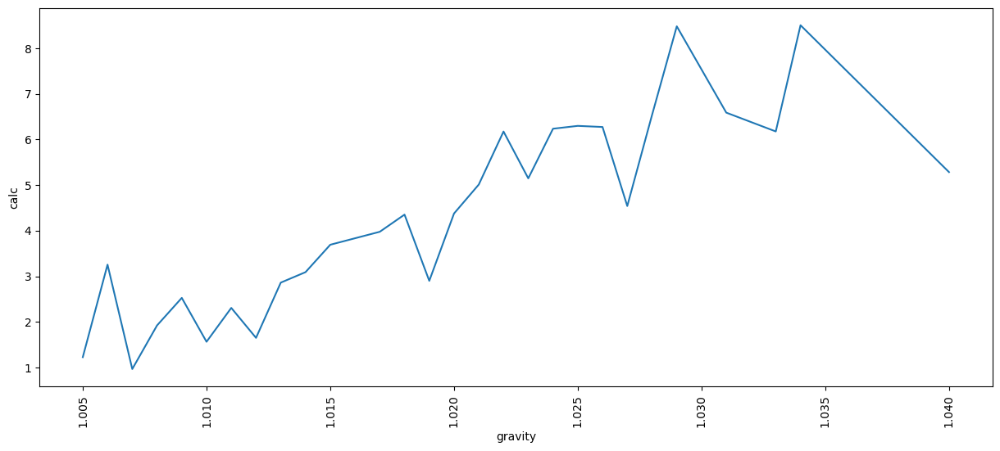

...

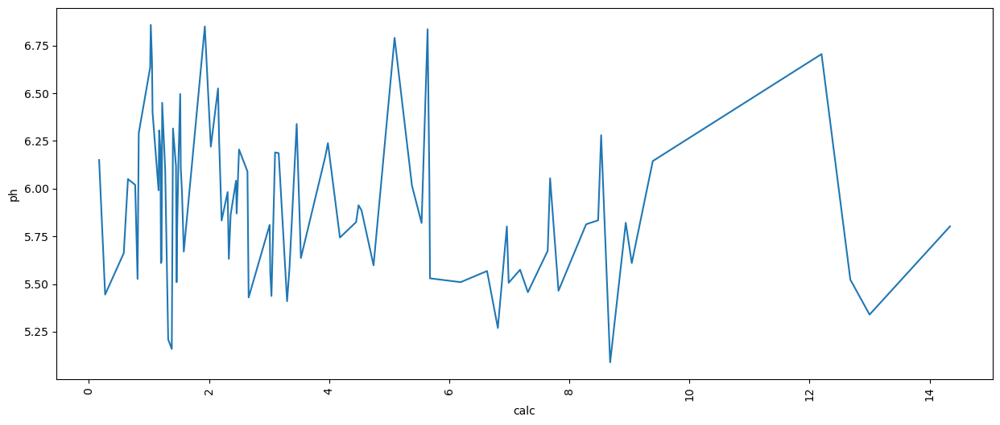

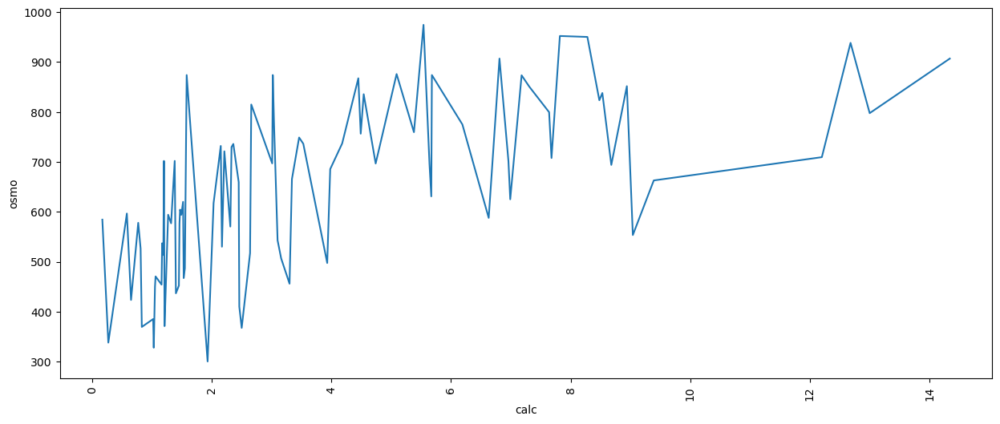

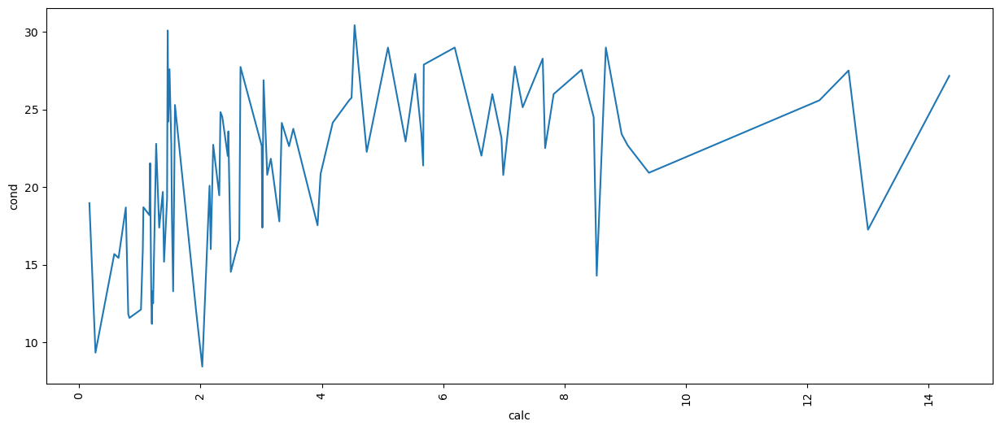

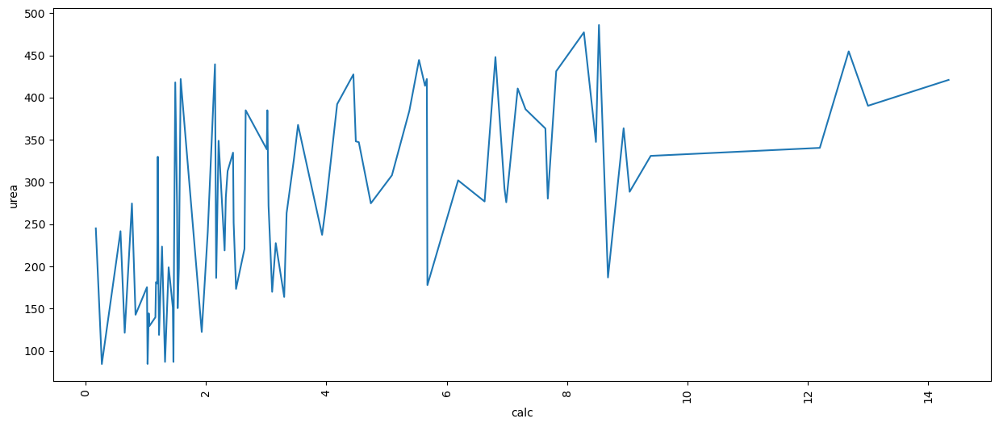

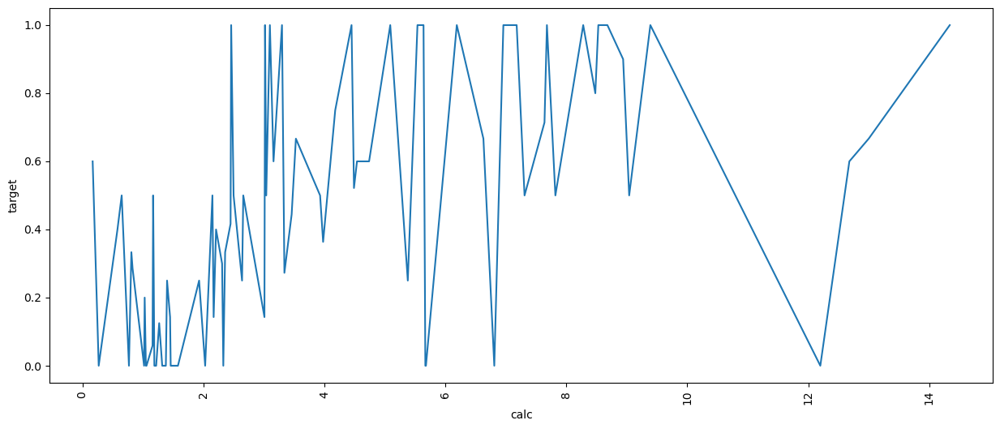

In [52]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                plt.figure(figsize=(15,6))
                sns.lineplot(x = df[i], y = df[j], data = df, ci = None, palette = 'hls')
                plt.xticks(rotation = 90)
                plt.show()

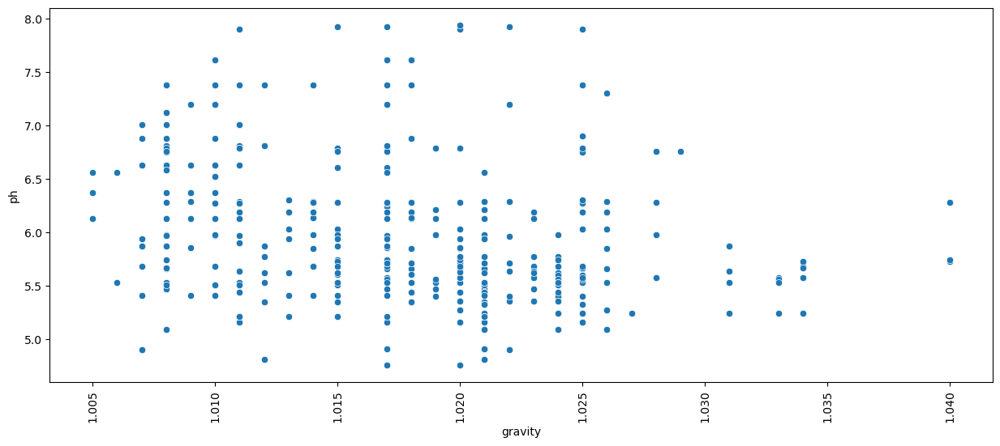

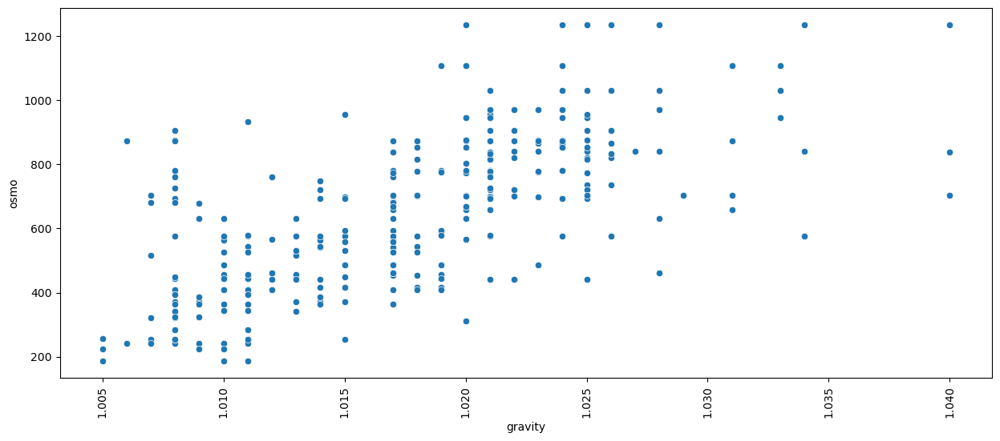

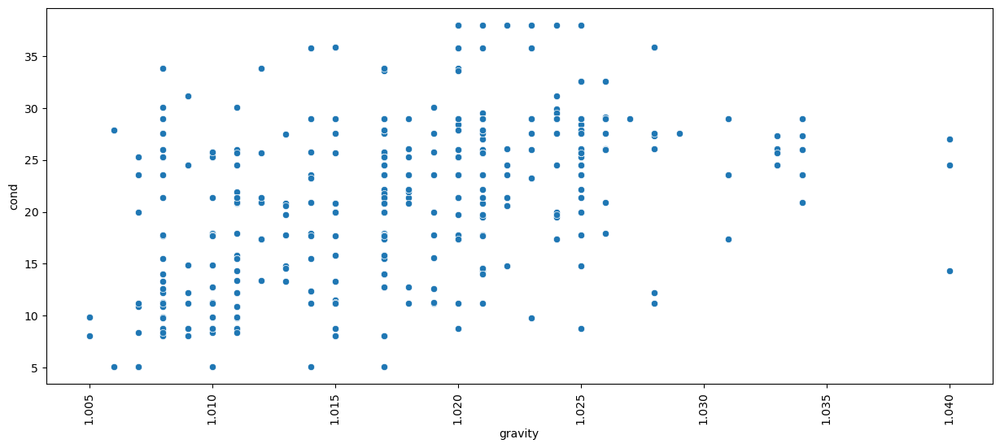

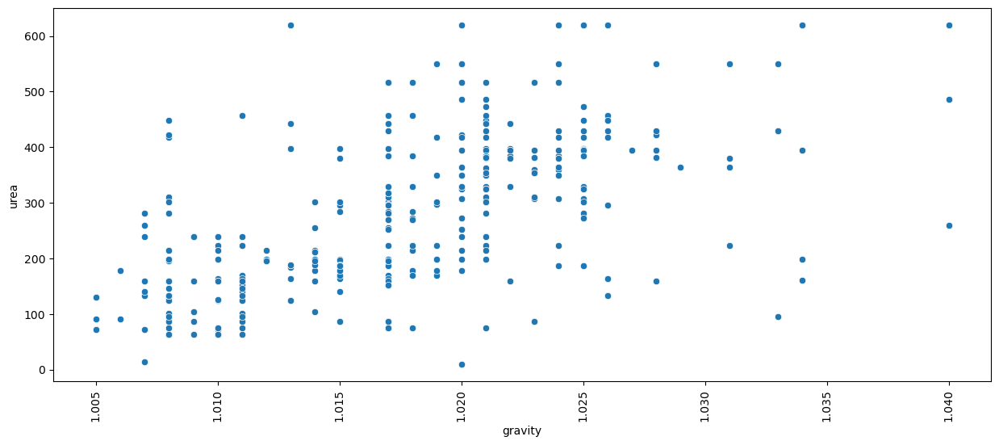

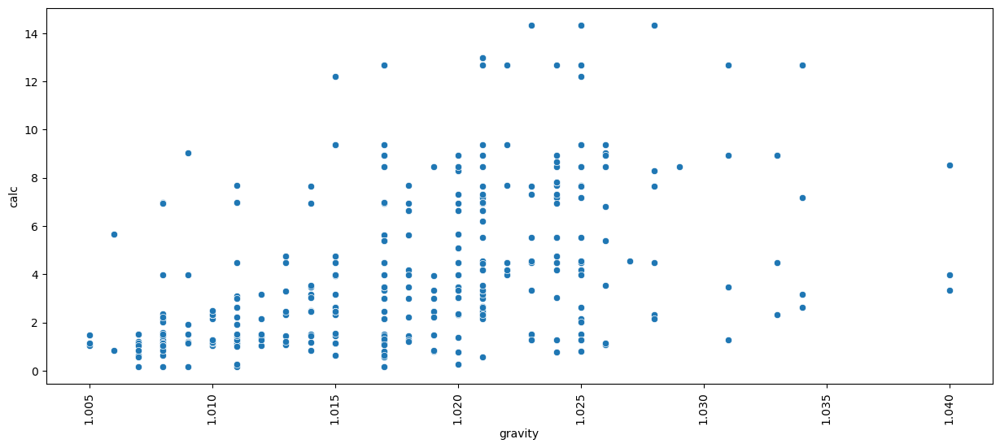

...

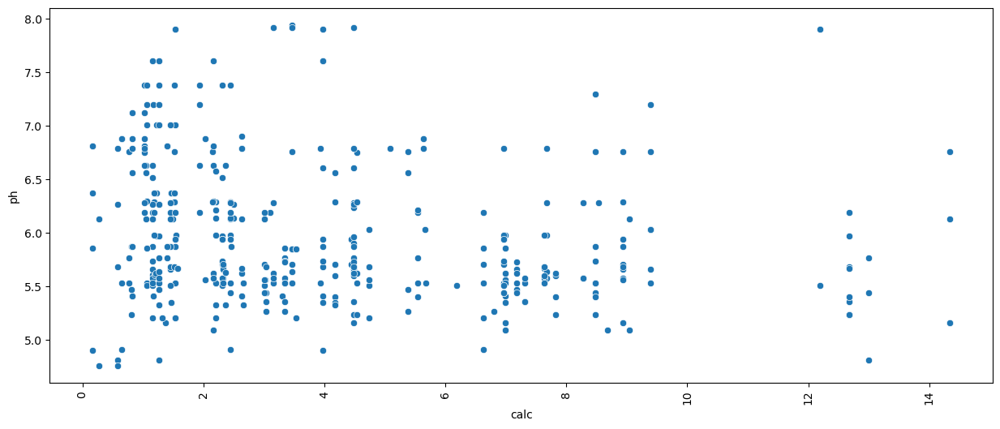

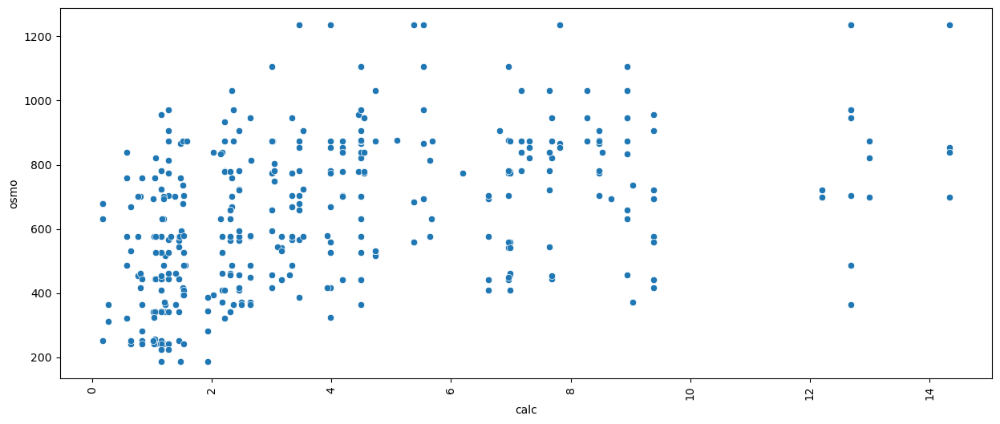

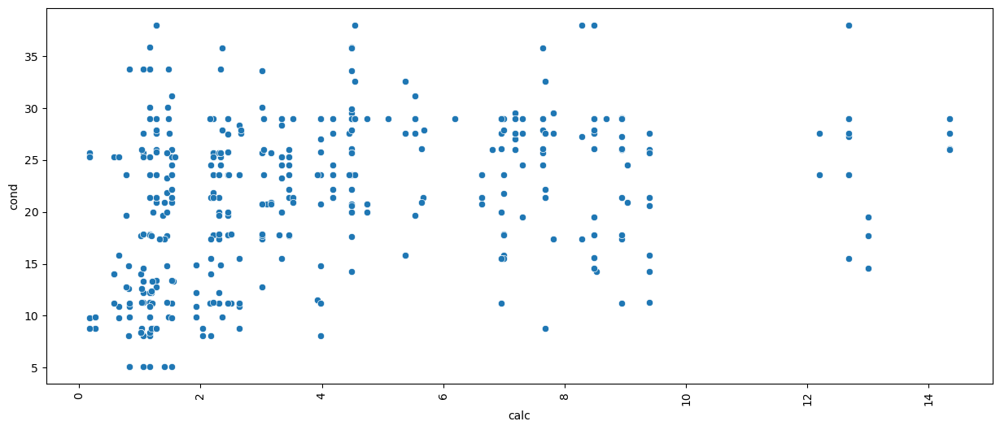

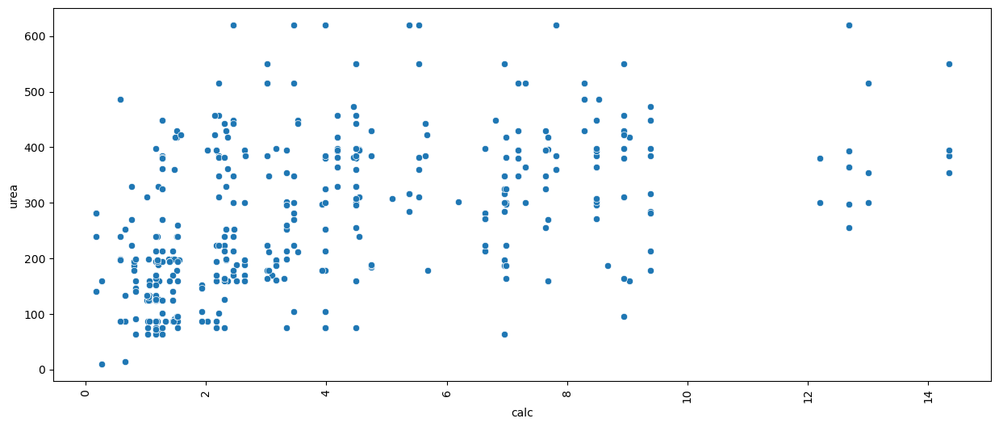

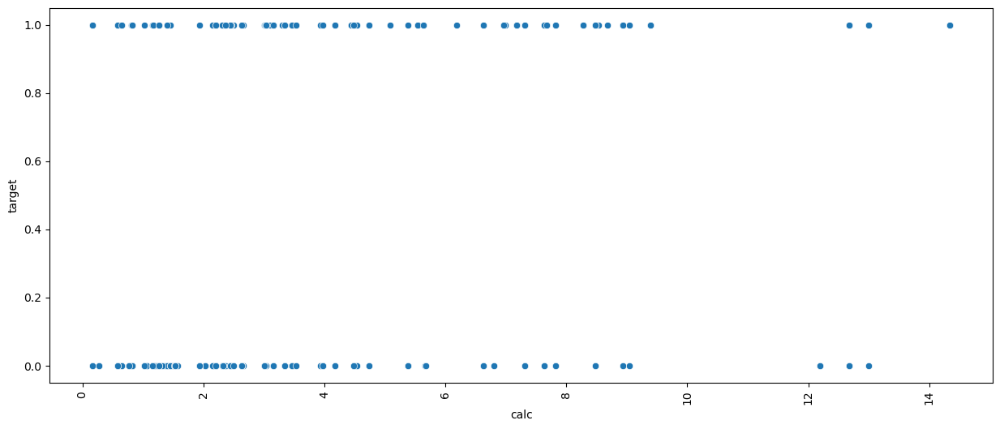

In [53]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                plt.figure(figsize=(15,6))
                sns.scatterplot(x = df[i], y = df[j], data = df,palette = 'hls')
                plt.xticks(rotation = 90)
                plt.show()

In [54]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                fig = px.line(df, x=i, y=j, color='target', template='plotly_dark')
                fig.update_layout(
                    title=f'{j} vs {i}',
                    xaxis_title=i,
                    yaxis_title=j
                )
                fig.show()

In [55]:
for i in df.columns:
    for j in df.columns:
        if i != j:
            if i != 'target':
                fig = px.scatter(df, x=i, y=j, color='target', color_discrete_sequence=['#636EFA', '#EF553B'])
                fig.update_layout(title=f'Scatter Plot of {i} vs {j}', xaxis_title=i, yaxis_title=j)
                fig.show()

In [56]:
import plotly.graph_objs as go

In [59]:
fig = go.Figure(data=[go.Scatter3d(
    x=df['gravity'],
    y=df['ph'],
    z=df['osmo'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['target'],
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(
    title='3D Scatter Plot',
    scene=dict(
        xaxis_title='Gravity',
        yaxis_title='pH',
        zaxis_title='Osmo'
    )
)

fig.show()

<Figure size 1500x600 with 0 Axes>

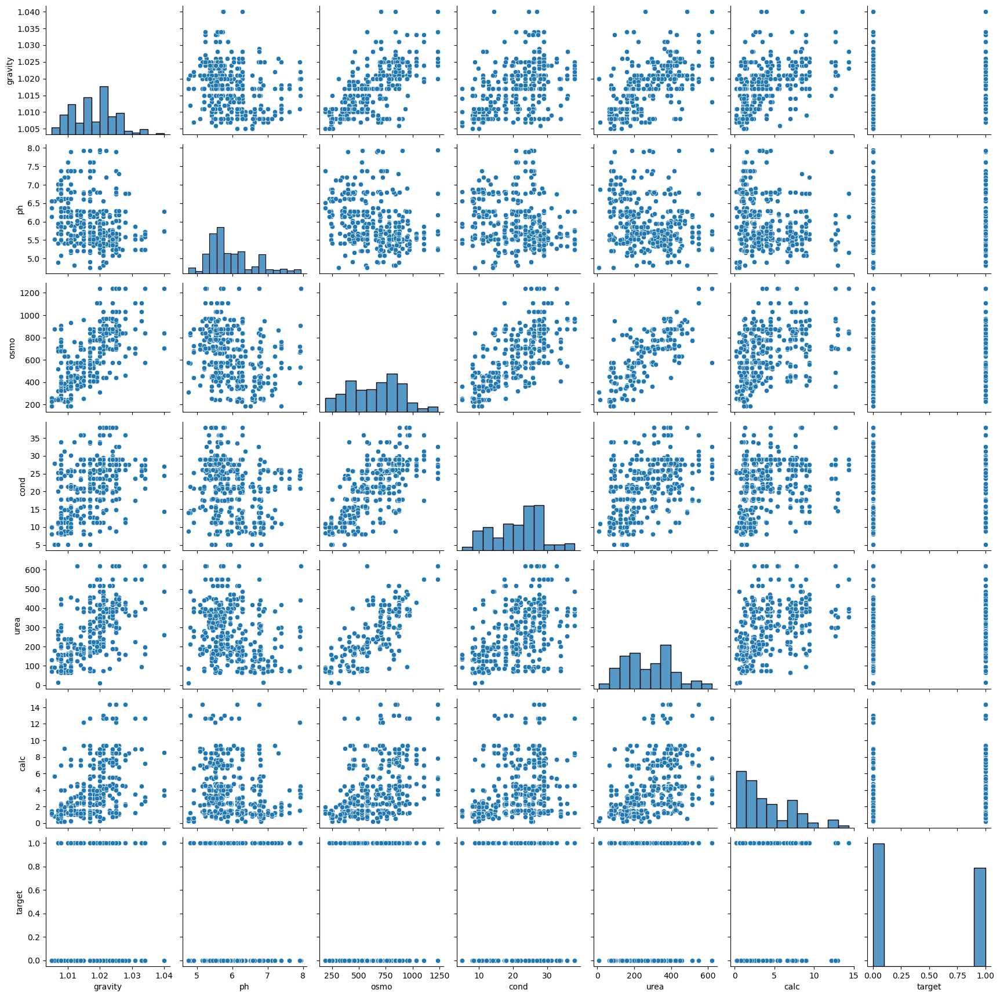

In [60]:
plt.figure(figsize=(15,6))
sns.pairplot(data = df, palette = 'hls')
plt.xticks(rotation = 90)
plt.show()

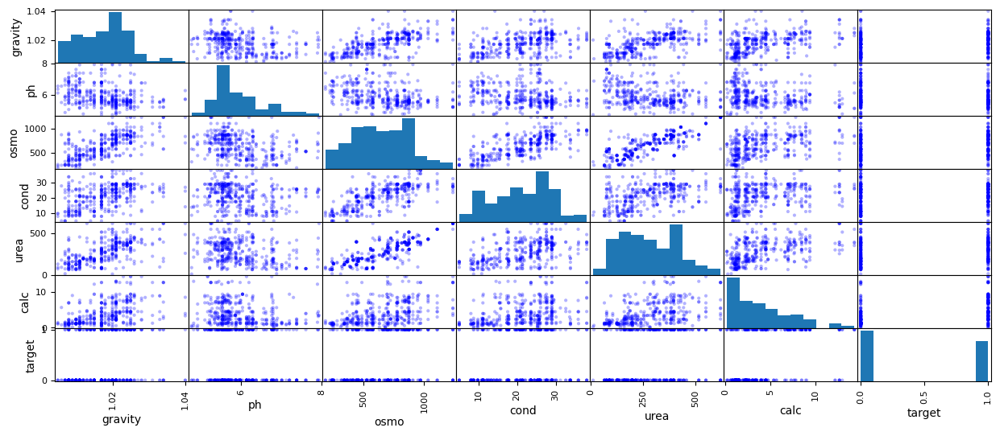

In [61]:
from pandas.plotting import scatter_matrix
scatter_matrix(df, diagonal='hist', color='b', alpha=0.3, figsize=(15,6))
fig = go.Figure(data=px.scatter_matrix(df, color='target', dimensions=['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']))
fig.update_layout(title='Pairplot of Features', width=800, height=800)
fig.show()

In [62]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

gravity      0.01
ph           0.75
osmo       384.75
cond        12.10
urea       215.00
calc         5.18
target       1.00
dtype: float64


In [64]:
df_new = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis = 1)]

In [65]:
df_new.shape

(399, 7)

In [66]:
from scipy.stats import ttest_ind

In [68]:
group1 = df[df['target'] == 0]['urea']
group2 = df[df['target'] == 1]['urea']

In [69]:
mean1, std1 = group1.mean(), group1.std()
mean2, std2 = group2.mean(), group2.std()

In [71]:
t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

In [72]:
print('Group 1 mean: {:.2f}, std: {:.2f}'.format(mean1, std1))
print('Group 2 mean: {:.2f}, std: {:.2f}'.format(mean2, std2))
print('t-statistic: {:.2f}, p-value: {:.2f}'.format(t_stat, p_value))

Group 1 mean: 246.33, std: 137.93
Group 2 mean: 319.07, std: 123.50
t-statistic: -5.65, p-value: 0.00


In [73]:
df_corr = df.corr()

In [75]:
df_corr

,gravity,ph,osmo,cond,urea,calc,target
gravity,1.000000,-0.290349,0.692317,0.470433,0.631710,0.494304,0.282577
ph,-0.290349,1.000000,-0.309495,-0.190185,-0.279749,-0.214402,-0.094983
osmo,0.692317,-0.309495,1.000000,0.708480,0.809880,0.472114,0.244770
cond,0.470433,-0.190185,0.708480,1.000000,0.499109,0.330609,0.172224
urea,0.631710,-0.279749,0.809880,0.499109,1.000000,0.489879,0.265211
calc,0.494304,-0.214402,0.472114,0.330609,0.489879,1.000000,0.467439
target,0.282577,-0.094983,0.244770,0.172224,0.265211,0.467439,1.000000


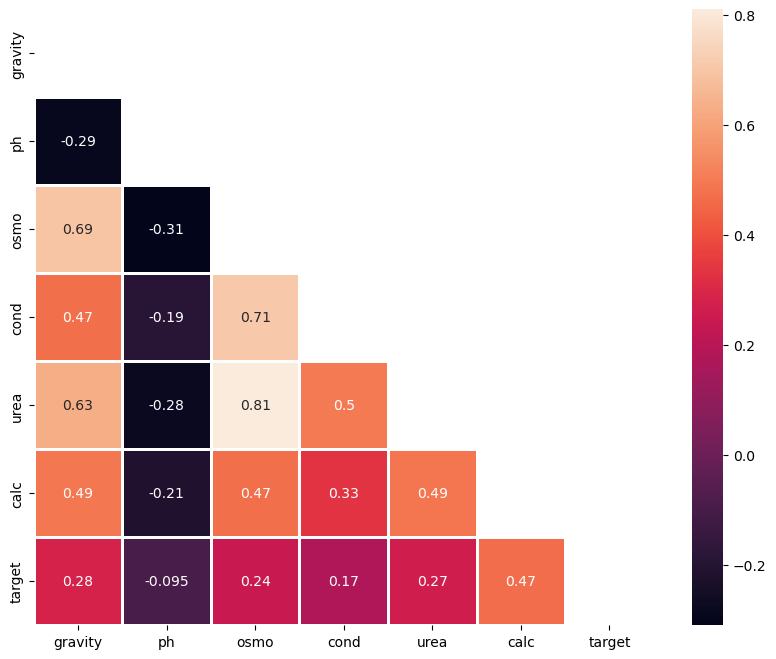

In [76]:
plt.figure(figsize=(10, 8))
matrix = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket");
plt.show()

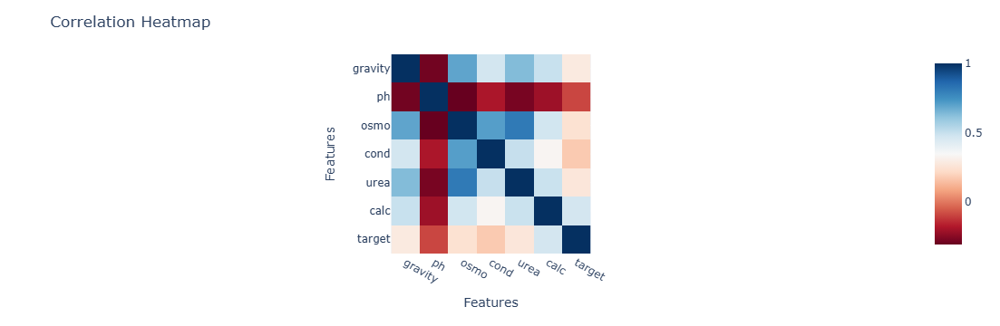

In [78]:
fig = px.imshow(df.corr(), color_continuous_scale='RdBu')

fig.update_layout(
    title='Correlation Heatmap',
    xaxis_title='Features',
    yaxis_title='Features',
)

fig.show()

In [80]:
df1 = df.copy()

In [82]:
df1['osmo_cond_ratio'] = df['osmo'] / df['cond']

# Create a new feature by subtracting calc from urea
df1['urea_calc_diff'] = df['urea'] - df['calc']

# Standardize the values of gravity, ph, osmo, cond, urea, and calc
df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] = (df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']] - df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].mean()) / df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc']].std()

# Create a new feature by multiplying osmo by urea
df1['osmo_urea_interaction'] = df['osmo'] * df['urea']

# Categorize the values of gravity, ph, osmo, cond, urea, and calc into 5 bins each
df1['gravity_bin'] = pd.qcut(df['gravity'], 5, labels=False)
df1['ph_bin'] = pd.qcut(df['ph'], 5, labels=False)
df1['osmo_bin'] = pd.qcut(df['osmo'], 5, labels=False)
df1['cond_bin'] = pd.qcut(df['cond'], 5, labels=False)
df1['urea_bin'] = pd.qcut(df['urea'], 5, labels=False)
df1['calc_bin'] = pd.qcut(df['calc'], 5, labels=False)

In [84]:
df1.head()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
0,-0.733145,0.365181,-0.888652,-0.883319,-1.133498,-0.828134,0,29.932432,122.55,54932,1,3,1,1,0,1
1,1.064616,-0.864851,0.219255,0.287711,0.845361,0.020314,0,29.788136,389.82,276982,4,0,2,2,3,3
2,-1.332398,0.271761,-1.195458,0.407476,-0.876979,1.530737,0,15.142857,149.96,58989,0,3,0,2,0,4
3,0.465362,-1.627781,-0.892914,-0.084889,0.874678,0.781741,1,21.250000,391.37,175916,3,0,0,1,4,3
4,0.465362,-0.662440,0.947918,-0.484104,0.779399,-0.591936,1,49.101124,382.79,336490,3,1,4,1,3,1


In [86]:
df1.tail()

,gravity,ph,osmo,cond,urea,calc,target,osmo_cond_ratio,urea_calc_diff,osmo_urea_interaction,gravity_bin,ph_bin,osmo_bin,cond_bin,urea_bin,calc_bin
409,-1.032771,-1.160681,-0.530713,-0.005046,-1.492624,-0.803271,0,24.626168,73.47,39525,0,0,1,2,0,1
410,0.914802,-0.662440,-0.317654,-0.231268,-0.400587,-1.039469,0,29.289340,223.23,129248,3,1,1,1,2,0
411,0.015922,0.505311,-0.837518,0.101411,-0.063448,1.108067,1,20.495495,262.32,122850,2,3,1,2,2,4
412,-1.482211,1.813192,-1.391472,-1.176077,-1.492624,-0.958664,1,25.793651,73.97,24375,0,4,0,0,0,0
413,-1.032771,0.271761,-1.225286,-1.535370,-0.876979,-1.194862,0,36.767677,158.73,57876,0,3,0,0,0,0


In [87]:
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction', 'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin', 'calc_bin']]
y = df1['target']

In [89]:
from sklearn.model_selection import train_test_split

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [91]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

lr = LogisticRegression(random_state=42)
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

# Evaluate the performance of the model
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.7710843373493976
Precision: 0.7567567567567568
Recall: 0.7368421052631579
F1 Score: 0.7466666666666667
Confusion matrix: [[36  9]
 [10 28]]
Classification report:               precision    recall  f1-score   support

           0       0.78      0.80      0.79        45
           1       0.76      0.74      0.75        38

    accuracy                           0.77        83
   macro avg       0.77      0.77      0.77        83
weighted avg       0.77      0.77      0.77        83



In [92]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters to tune
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

# Perform grid search cross-validation to find the best hyperparameters
lr = LogisticRegression(random_state=42)
grid_search = GridSearchCV(lr, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding mean cross-validation score
print('Best Hyperparameters:', grid_search.best_params_)
print('Best Mean Cross-Validation Score:', grid_search.best_score_)

Best Hyperparameters: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Best Mean Cross-Validation Score: 0.7549977385798281


In [93]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train, y_train)

y_pred = dtc.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6867469879518072
Precision: 0.7
Recall: 0.5526315789473685
F1 Score: 0.6176470588235294
Confusion matrix: [[36  9]
 [17 21]]
Classification report:               precision    recall  f1-score   support

           0       0.68      0.80      0.73        45
           1       0.70      0.55      0.62        38

    accuracy                           0.69        83
   macro avg       0.69      0.68      0.68        83
weighted avg       0.69      0.69      0.68        83



In [94]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

dtc = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(dtc, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print('Best Hyperparameters:', grid_search.best_params_)
print('Best Mean Cross-Validation Score:', grid_search.best_score_)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Mean Cross-Validation Score: 0.7038444142921755


In [95]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=42)

rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6987951807228916
Precision: 0.7096774193548387
Recall: 0.5789473684210527
F1 Score: 0.6376811594202898
Confusion matrix: [[36  9]
 [16 22]]
Classification report:               precision    recall  f1-score   support

           0       0.69      0.80      0.74        45
           1       0.71      0.58      0.64        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.69        83



In [96]:
rfc = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print('Best hyperparameters:', grid_search.best_params_)
print('Accuracy:', grid_search.best_score_)

best_rfc = grid_search.best_estimator_
y_pred = best_rfc.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.7398914518317504
Accuracy: 0.6987951807228916
Precision: 0.696969696969697
Recall: 0.6052631578947368
F1 Score: 0.647887323943662
Confusion matrix: [[35 10]
 [15 23]]
Classification report:               precision    recall  f1-score   support

           0       0.70      0.78      0.74        45
           1       0.70      0.61      0.65        38

    accuracy                           0.70        83
   macro avg       0.70      0.69      0.69        83
weighted avg       0.70      0.70      0.70        83



In [102]:
from xgboost import XGBClassifier

xgb = XGBClassifier(random_state=42)

xgb.fit(X_train, y_train)

y_pred = xgb.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.7228915662650602
Precision: 0.7142857142857143
Recall: 0.6578947368421053
F1 Score: 0.684931506849315
Confusion matrix: [[35 10]
 [13 25]]
Classification report:               precision    recall  f1-score   support

           0       0.73      0.78      0.75        45
           1       0.71      0.66      0.68        38

    accuracy                           0.72        83
   macro avg       0.72      0.72      0.72        83
weighted avg       0.72      0.72      0.72        83



In [104]:
params = {
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
}

xgb = XGBClassifier(random_state=42)

grid_search = GridSearchCV(xgb, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)


print('Best Hyperparameters:', grid_search.best_params_)
print('Best Accuracy:', grid_search.best_score_)

y_pred = grid_search.best_estimator_.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Best Hyperparameters: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100}
Best Accuracy: 0.7189054726368159
Accuracy: 0.7349397590361446
Precision: 0.7105263157894737
Recall: 0.7105263157894737
F1 Score: 0.7105263157894737
Confusion matrix: [[34 11]
 [11 27]]
Classification report:               precision    recall  f1-score   support

           0       0.76      0.76      0.76        45
           1       0.71      0.71      0.71        38

    accuracy                           0.73        83
   macro avg       0.73      0.73      0.73        83
weighted avg       0.73      0.73      0.73        83



[12:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[12:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[12:07:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:07:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [106]:
from sklearn.svm import SVC

svc = SVC(kernel='linear', random_state=42)

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision:', precision_score(y_test, y_pred))
print('Recall:', recall_score(y_test, y_pred))
print('F1 Score:', f1_score(y_test, y_pred))
print('Confusion matrix:', confusion_matrix(y_test, y_pred))
print('Classification report:', classification_report(y_test, y_pred))

Accuracy: 0.6746987951807228
Precision: 0.6170212765957447
Recall: 0.7631578947368421
F1 Score: 0.6823529411764706
Confusion matrix: [[27 18]
 [ 9 29]]
Classification report:               precision    recall  f1-score   support

           0       0.75      0.60      0.67        45
           1       0.62      0.76      0.68        38

    accuracy                           0.67        83
   macro avg       0.68      0.68      0.67        83
weighted avg       0.69      0.67      0.67        83



In [108]:
X_train.shape

(331, 15)

In [110]:
df1.columns


Index(['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'target',
       'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction',
       'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin',
       'calc_bin'],
      dtype='object')

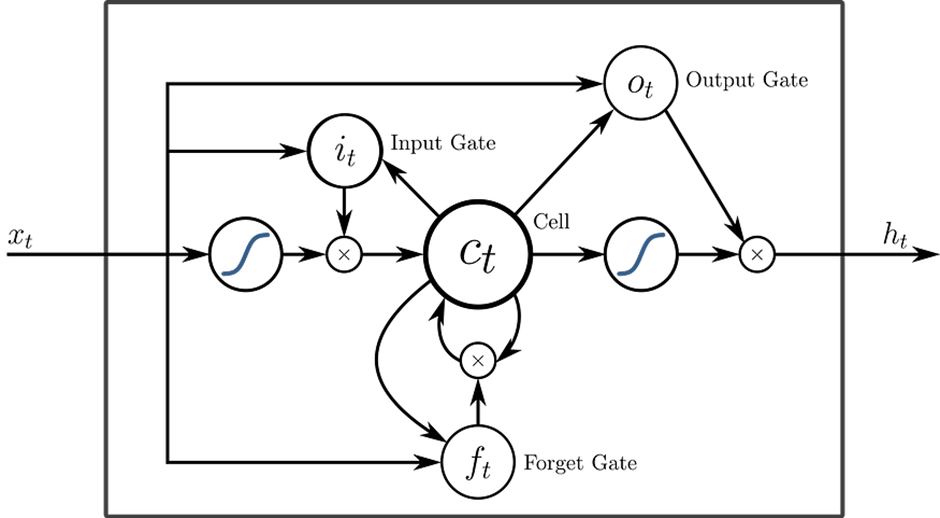

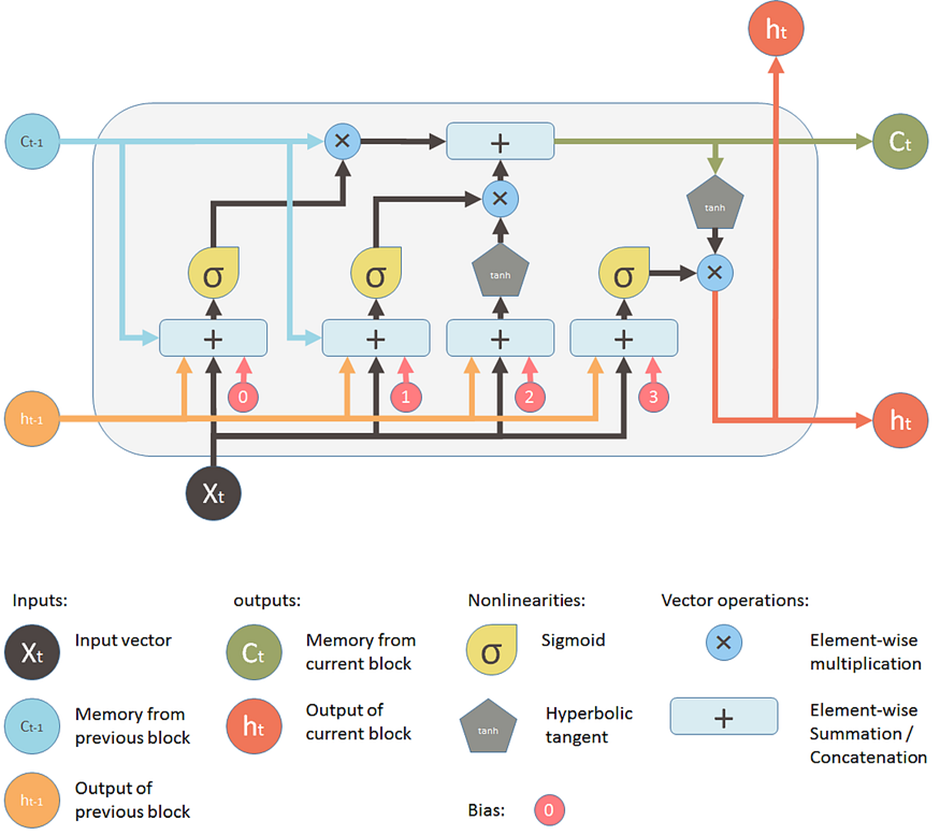

In [114]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPooling1D, Bidirectional, LSTM
from keras.callbacks import EarlyStopping

In [115]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, Dropout, Bidirectional, LSTM
from sklearn.model_selection import train_test_split

# Define X and y
X = df1[['gravity', 'ph', 'osmo', 'cond', 'urea', 'calc', 'osmo_cond_ratio', 'urea_calc_diff', 'osmo_urea_interaction', 'gravity_bin', 'ph_bin', 'osmo_bin', 'cond_bin', 'urea_bin', 'calc_bin']]
y = df1['target']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape X_train and X_test to be 3D arrays
X_train = np.reshape(X_train.to_numpy(), (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test.to_numpy(), (X_test.shape[0], X_test.shape[1], 1))

# Define the model
model = Sequential()

# Convolutional layers
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Conv1D(filters=64, kernel_size=3, padding='same', activation='relu'))
model.add(Conv1D(filters=128, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.2))

# BiLSTM layers
model.add(Bidirectional(LSTM(128, return_sequences=True)))
model.add(Bidirectional(LSTM(64)))
model.add(Dropout(0.2))

# Dense layers
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=75, batch_size=64, validation_split=0.2)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', loss)
print('Test accuracy:', accuracy)


Epoch 1/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 307ms/step - accuracy: 0.5458 - loss: 0.6821 - val_accuracy: 0.5522 - val_loss: 0.7125
Epoch 2/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.5714 - loss: 0.6993 - val_accuracy: 0.5522 - val_loss: 0.6849
Epoch 3/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5656 - loss: 0.6821 - val_accuracy: 0.4478 - val_loss: 0.6961
Epoch 4/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5237 - loss: 0.6955 - val_accuracy: 0.5522 - val_loss: 0.6929
Epoch 5/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5686 - loss: 0.6878 - val_accuracy: 0.5522 - val_loss: 0.7107
Epoch 6/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5379 - loss: 0.7065 - val_accuracy: 0.5522 - val_loss: 0.6809
Epoch 7/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5760 - loss: 0.6806 - val_accuracy: 0.5522 - val_loss: 0.6790
Epoch 8/75
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.5642 - loss: 0.6777 - val_accuracy: 0.5522 - val_loss: 0.676

In [ ]:
model.save('my_model.h5')

In [ ]:
df1.info()

In [ ]:
df1.head()